In [1]:
import sys
from bertopic import BERTopic
from umap import UMAP
import re
sys.path.append('../code/')
from training_data_handler import TrainingDataHandler
import spacy
from tqdm import tqdm
from textblob_de import TextBlobDE, Word
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import silhouette_score
import numpy as np
from hdbscan import HDBSCAN

/Users/vetonmatoshi/opt/anaconda3/envs/politmonitor/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
tdh = TrainingDataHandler()

In [3]:
language = 'de'
tdh.get_training_data(language=language, affair_text_scope=['zh','ch'], affair_attachment_category='all', merge_texts=False, running_mode='experimental')

In [4]:
def replace_specal_characters(text):
    text_new = re.sub(r'ä',r'ae',text)
    text_new = re.sub(r'ü',r'ue',text_new)
    text_new = re.sub(r'ö',r'oe',text_new)
    return text_new

In [5]:
docs = tdh.training_data_df[tdh.training_data_df.split=='train'].text.unique()
docs = list(docs)
docs_postprocessed = [replace_specal_characters(x) for x in docs]
print(len(docs_postprocessed))
print(len(set(docs_postprocessed)))



4314
4314


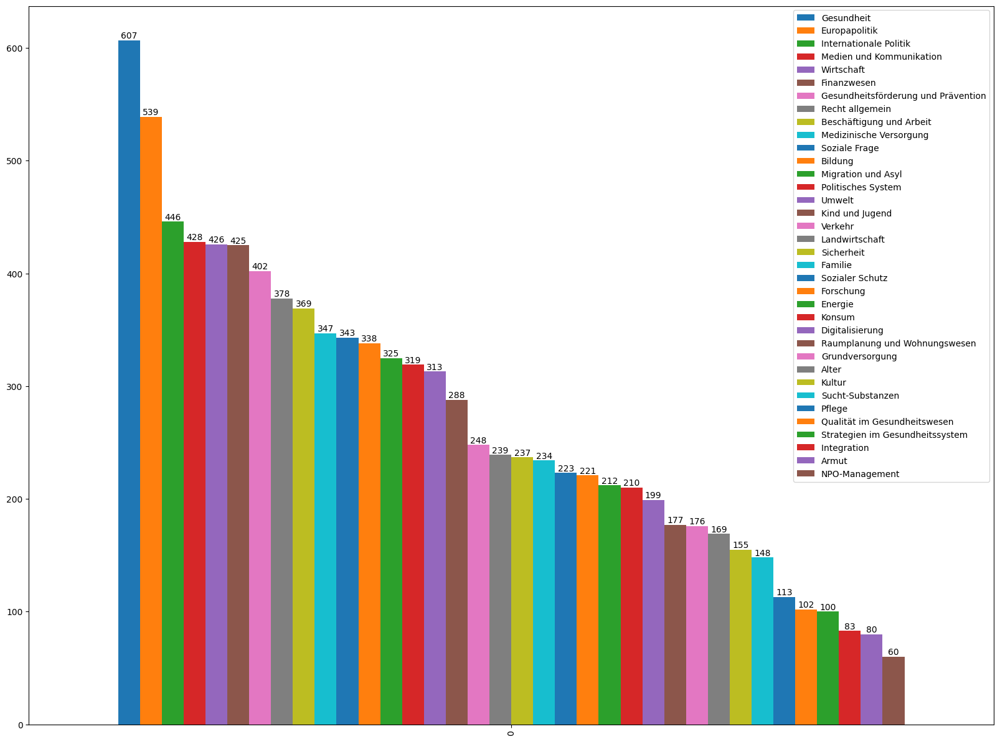

In [6]:
df_for_visualization = tdh.training_data_df[tdh.training_data_df.split=='train'].drop_duplicates('text')
tdh.create_barplot(df_for_visualization)

- Using the same model as for training

In [7]:
# Define custom lemmatizer


class LemmaTokenizer:
    def __init__(self):
        self.nlp = spacy.load("de_dep_news_trf", disable = ['ner', 'parser', 'textcat'])
        self.nlp.max_length=3000000
    def __call__(self, doc):
        blob = TextBlobDE(doc)
        w = TextBlobDE(doc)
        lemmas = w.words.lemmatize()
        words_tags = w.tags
        tags = [x[1] for x in words_tags]
        lemmas_tags = list(zip(lemmas, tags))
        lemmas = [x[0] for x in lemmas_tags if x[1]=='NN']
        return lemmas
        # return [t.lemma_ for t in tqdm(self.nlp(doc)) if t.pos_ in ['NOUN', 'PROPN']]

vectorizer_model= CountVectorizer(tokenizer=LemmaTokenizer()) 


In [8]:
#Load the Bert model for German

from sentence_transformers import models
from sentence_transformers import SentenceTransformer

# load BERT model from Hugging Face
checkpoint = 'joelito/legal-german-roberta-large'
word_embedding_model = models.Transformer(
    checkpoint)

# Apply mean pooling to get one fixed sized sentence vector
pooling_model = models.Pooling(word_embedding_model.get_word_embedding_dimension(),
                               pooling_mode_mean_tokens=True,
                               pooling_mode_cls_token=False,
                               pooling_mode_max_tokens=False)

# join BERT model and pooling to get the sentence transformer
model = SentenceTransformer('T-Systems-onsite/cross-en-de-roberta-sentence-transformer', device='mps')
#model = SentenceTransformer(modules=[word_embedding_model, pooling_model], device='mps')


Some weights of the model checkpoint at joelito/legal-german-roberta-large were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.bias', 'lm_head.dense.bias']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaModel were not initialized from the model checkpoint at joelito/legal-german-roberta-large and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and

In [9]:
# Convert to embeddings
embeddings = model.encode(docs, show_progress_bar=True)

Batches: 100%|████████████████████████████████| 135/135 [00:50<00:00,  2.70it/s]


In [ ]:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)
# topics, probs = topic_model.fit_transform(docs, embeddings)

for n in range(5,20):
    hdbscan_model = HDBSCAN(min_cluster_size=n, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
    topic_model = BERTopic(vectorizer_model=vectorizer_model, hdbscan_model=hdbscan_model)

    topics, probs = topic_model.fit_transform(docs, reduced_embeddings)
    
    indices = [index for index, topic in enumerate(topics) if topic != -1]
    X = reduced_embeddings[np.array(indices)]
    labels = [topic for index, topic in enumerate(topics) if topic != -1]

    # Calculate silhouette score
    print(n,': ',silhouette_score(X, labels))

100%|██████████████████████████████████████| 84/84 [00:00<00:00, 1552077.25it/s]


100%|████████████████████████████████████| 440/440 [00:00<00:00, 3122662.88it/s]


100%|███████████████████████████████████████| 39/39 [00:00<00:00, 908765.87it/s]


100%|██████████████████████████████████| 5183/5183 [00:00<00:00, 4139199.85it/s]


100%|████████████████████████████████████| 181/181 [00:00<00:00, 1921946.90it/s]


100%|████████████████████████████████████| 669/669 [00:00<00:00, 2742902.62it/s]


In [25]:
# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
# This might be a good idea for visualization
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)
topics, probs = topic_model.fit_transform(docs, embeddings)


- Find best value for dimension reduction

In [23]:
indices = [index for index, topic in enumerate(topics) if topic != -1]
X = reduced_embeddings[np.array(indices)]
labels = [topic for index, topic in enumerate(topics) if topic != -1]

# Calculate silhouette score
silhouette_score(X, labels)

0.38905677

In [10]:
topic_model.visualize_documents(docs, reduced_embeddings=reduced_embeddings, sample=0.1)



In [11]:
hierarchical_topics = topic_model.hierarchical_topics(docs)
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)


100%|██████████████████████████████████████████| 56/56 [00:00<00:00, 296.55it/s]


In [12]:
topic_model.visualize_hierarchical_documents(docs, hierarchical_topics, reduced_embeddings=reduced_embeddings)



In [17]:
topic_information = topic_model.get_topic_info()

print(type(topic_information))
topic_information[topic_information.Name.str.contains('frau')]


<class 'pandas.core.frame.DataFrame'>


,Topic,Count,Name


In [14]:
topic_id = 56
topic_model.get_topic(topic_id)



[('Fr', 0.2389192991185608),
 ('pationt', 0.2389192991185608),
 ('outcome', 0.2389192991185608),
 ('zeitvorsorgesystems', 0.2389192991185608),
 ('measures', 0.2389192991185608),
 ('luganobereinkommens', 0.2389192991185608),
 ('vereinfachtes', 0.2389192991185608),
 ('zukunftsfhiges', 0.219121765630155),
 ('reported', 0.20754371836855798),
 ('zeitgemsses', 0.20754371836855798)]

In [15]:
T = topic_model.get_document_info(docs)
docs_per_topics = T.groupby(["Topic"]).apply(lambda x: x.index).to_dict()
for x in list(docs_per_topics[topic_id]):
    print(tdh.training_data_df[tdh.training_data_df.text==docs[x]].affair_topic_codes_as_labels.tolist())
    print(docs[x])
    print('##############################')
    

[['Pflege', 'Medizinische Versorgung'], ['Pflege', 'Medizinische Versorgung']]
Für eine freie und frühzeitige Planung der letzten Lebensphase
##############################
[['NPO-Management', 'Recht allgemein']]
Zeitgemässes und zukunftsfähiges Genossenschaftsrecht
##############################
[['Europapolitik', 'Beschäftigung und Arbeit'], ['Europapolitik', 'Beschäftigung und Arbeit'], ['Internationale Politik', 'Gesundheit', 'Wirtschaft'], ['Europapolitik', 'Beschäftigung und Arbeit']]
Optimierung der flankierenden Massnahmen zur Personenfreizügigkeit. Vereinfachtes Verfahren für die Verlängerung der Normalarbeitsverträge
##############################
[['Bildung', 'Kultur']]
Erfolgt mündlich.
##############################
[['Medizinische Versorgung', 'Sozialer Schutz']]
Höhere Franchisen für alle zugänglich machen
##############################
[['Bildung', 'Qualität im Gesundheitswesen']]
Obligatorium zur Nutzung vom Pationt Reported Outcome Measures (Proms)
###################

In [16]:
tdh.training_data_df[tdh.training_data_df.text==docs[x]].affair_text_srcid




42417    20173582
57658    20194038
Name: affair_text_srcid, dtype: int64